In [1]:
import matplotlib.pyplot as plt
import tensorflow as tf
from functions import generator
import os
from tensorflow.keras.models import load_model

In [2]:
# load the model from the file
model = load_model('naira_model_92.h5')

In [3]:
batch_size = 100
test_images_count = batch_size
while test_images_count == batch_size:
    test_images, targets = next(generator('data/test', batch_size=batch_size))
    test_images_count = test_images.shape[0]
    if test_images_count == batch_size:
        print('increasing batch_size to get all test samples..')
        batch_size *= 2
        test_images, targets = next(generator('data/test', batch_size=batch_size))
        test_images_count = test_images.shape[0]

In [4]:
pre_dict = {}
train_dir = 'data/test'
for count, classes in enumerate(os.listdir(train_dir)):
    pre_dict[f'model_{count}']  = classes
pre_dict

{'model_0': '10 naira',
 'model_1': '100 naira',
 'model_2': '1000 naira',
 'model_3': '20 naira',
 'model_4': '200 naira',
 'model_5': '5 naira',
 'model_6': '50 naira',
 'model_7': '500 naira'}

In [5]:
true_labels = []
for i in range(test_images.shape[0]):
    for key, values in targets.items():
        if values[i] == 1:
            true_labels.append(pre_dict[key])

In [6]:
predictions = []
for images in test_images:
    predict_img = tf.expand_dims(images, axis=0)
    predictions.append(model.predict(predict_img, verbose=0))

Image 1
Prediction: 10 naira  |  Actual: 10 naira


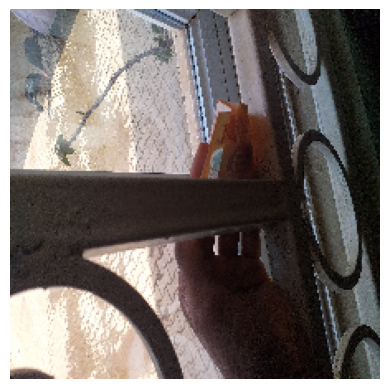

Image 2
Prediction: 1000 naira  |  Actual: 1000 naira


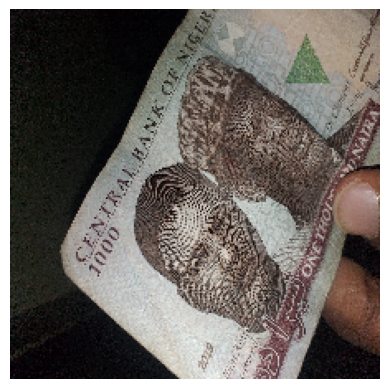

Image 3
Prediction: 500 naira  |  Actual: 500 naira


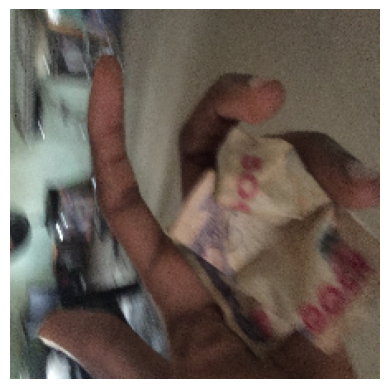

Image 4
Prediction: 10 naira  |  Actual: 10 naira


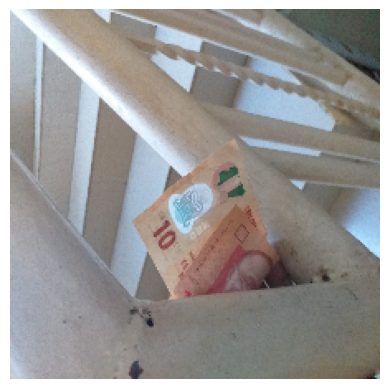

Image 5
Prediction: 10 naira  |  Actual: 10 naira


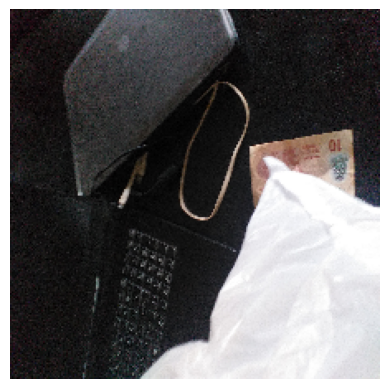

Image 6
Prediction: 10 naira  |  Actual: 10 naira


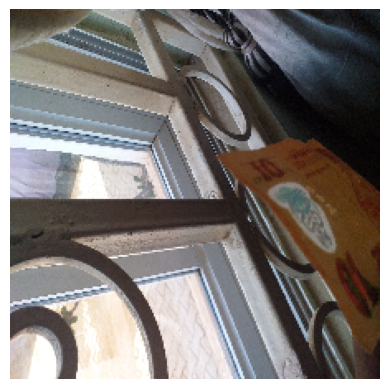

Image 7
Prediction: 10 naira  |  Actual: 50 naira


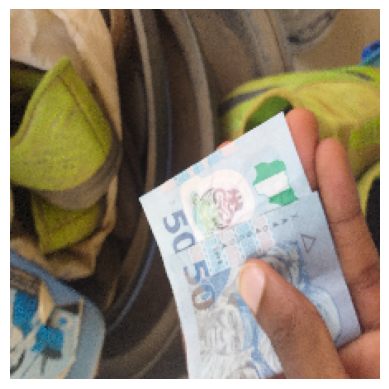

Image 8
Prediction: 20 naira  |  Actual: 20 naira


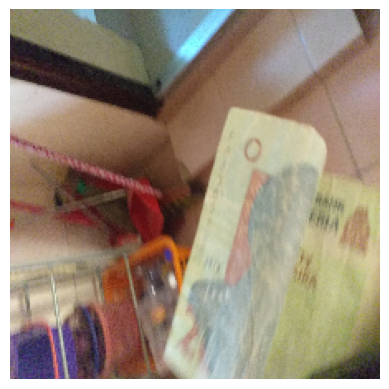

Image 9
Prediction: 20 naira(unsure)  |  Actual: 20 naira


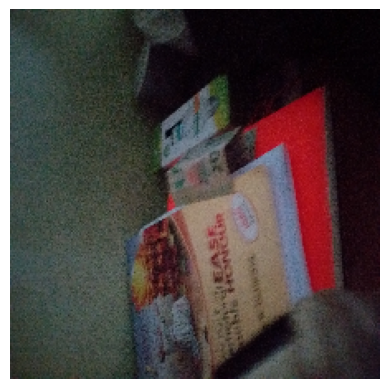

Image 10
Prediction: 100 naira  |  Actual: 100 naira


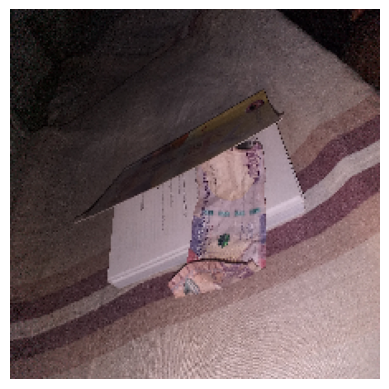

Image 11
Prediction: 5 naira  |  Actual: 5 naira


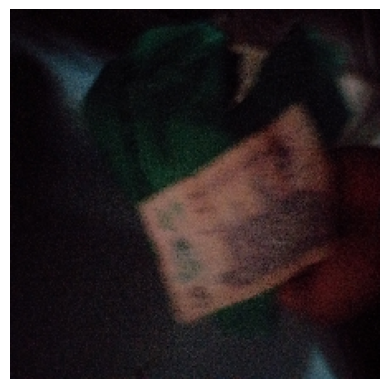

Image 12
Prediction: 100 naira(unsure)  |  Actual: 5 naira


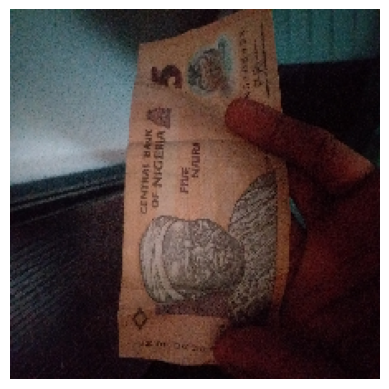

Image 13
Prediction: 100 naira  |  Actual: 100 naira


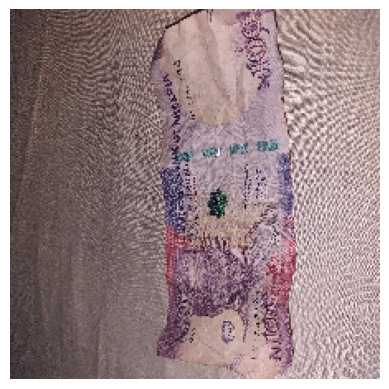

Image 14
Prediction: 20 naira  |  Actual: 20 naira


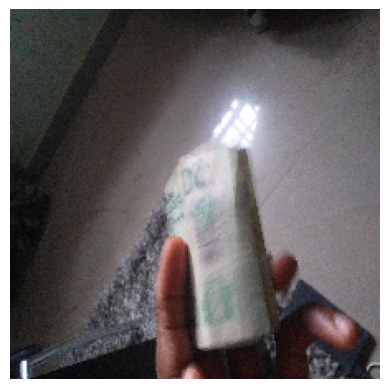

Image 15
Prediction: 50 naira  |  Actual: 50 naira


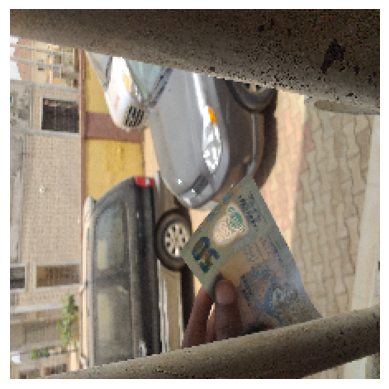

Image 16
Prediction: 200 naira  |  Actual: 200 naira


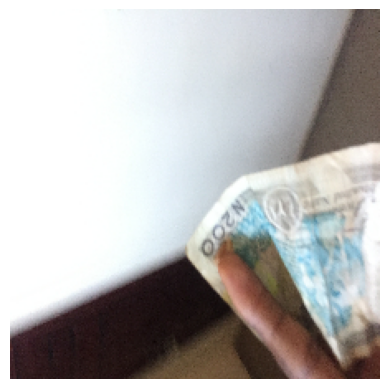

Image 17
Prediction: 10 naira  |  Actual: 10 naira


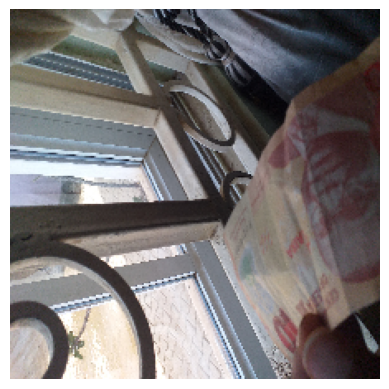

Image 18
Prediction: 200 naira  |  Actual: 200 naira


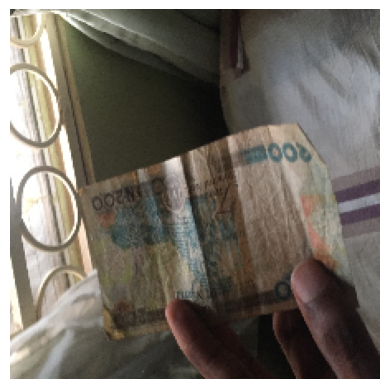

Image 19
Prediction: 1000 naira  |  Actual: 1000 naira


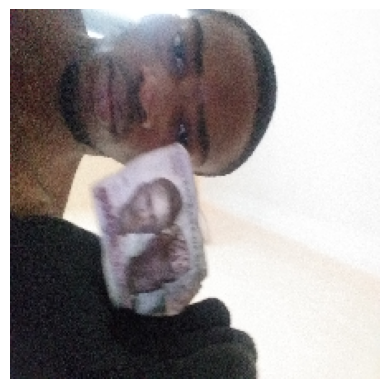

Image 20
Prediction: 200 naira  |  Actual: 200 naira


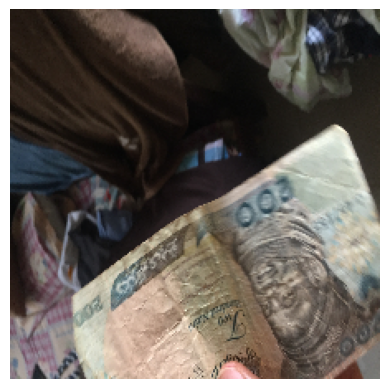

Image 21
Prediction: 100 naira  |  Actual: 100 naira


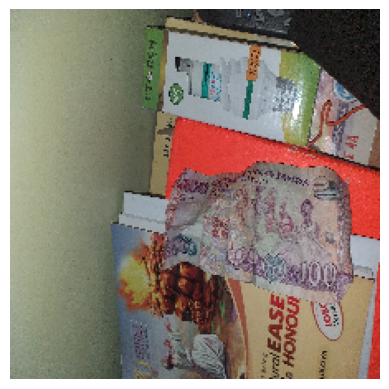

Image 22
Prediction: 500 naira  |  Actual: 500 naira


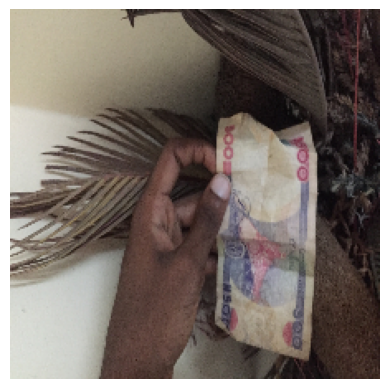

Image 23
Prediction: 20 naira  |  Actual: 20 naira


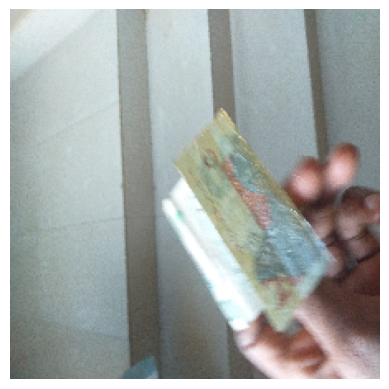

Image 24
Prediction: 200 naira  |  Actual: 200 naira


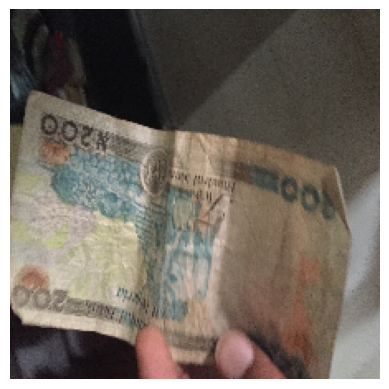

Image 25
Prediction: 20 naira  |  Actual: 20 naira


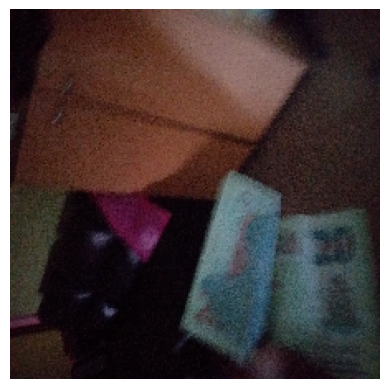

Image 26
Prediction: 20 naira  |  Actual: 20 naira


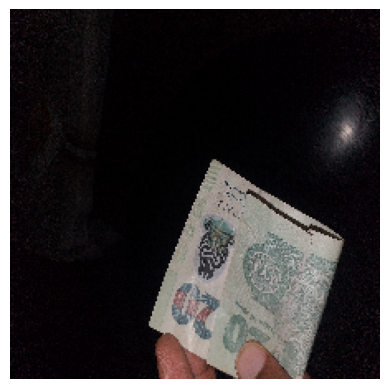

Image 27
Prediction: 100 naira(unsure)  |  Actual: 10 naira


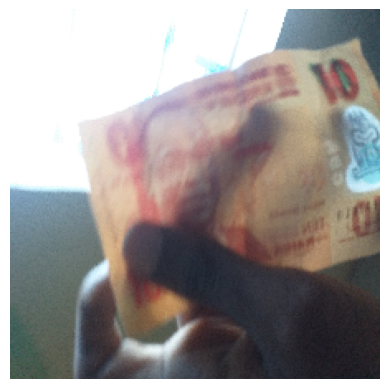

Image 28
Prediction: 100 naira  |  Actual: 100 naira


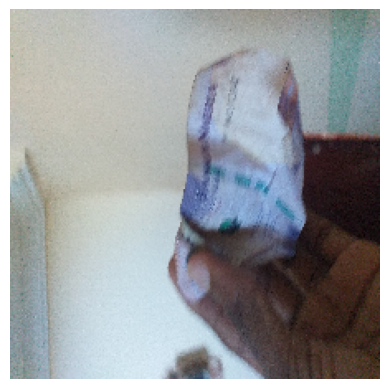

Image 29
Prediction: 500 naira(unsure)  |  Actual: 500 naira


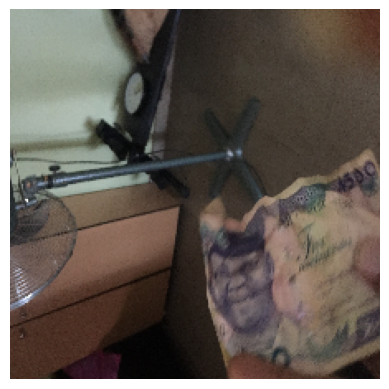

Image 30
Prediction: 50 naira  |  Actual: 50 naira


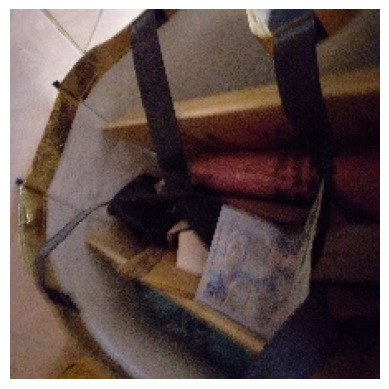

Image 31
Prediction: 20 naira(unsure)  |  Actual: 20 naira


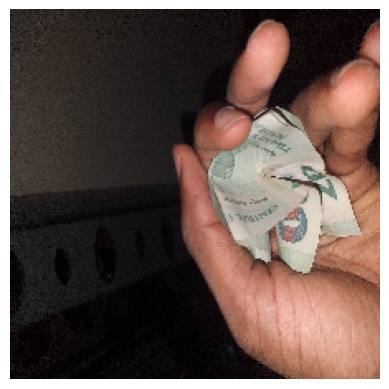

Image 32
Prediction: 5 naira  |  Actual: 5 naira


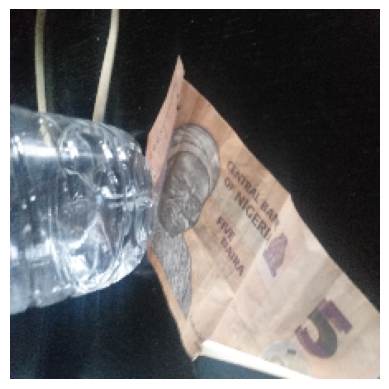

Image 33
Prediction: 20 naira  |  Actual: 20 naira


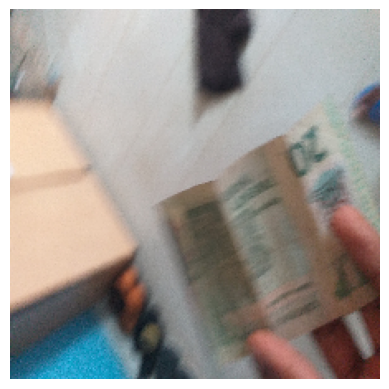

Image 34
Prediction: 500 naira  |  Actual: 500 naira


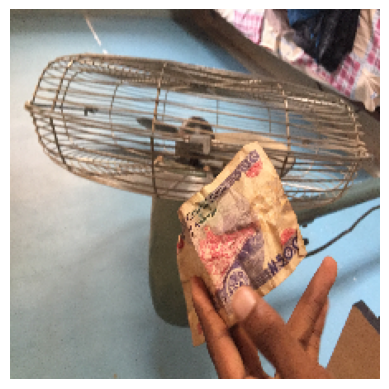

Image 35
Prediction: 1000 naira  |  Actual: 1000 naira


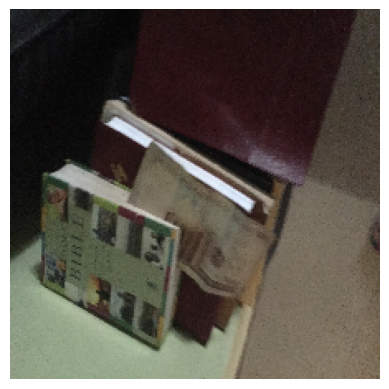

Image 36
Prediction: 500 naira  |  Actual: 500 naira


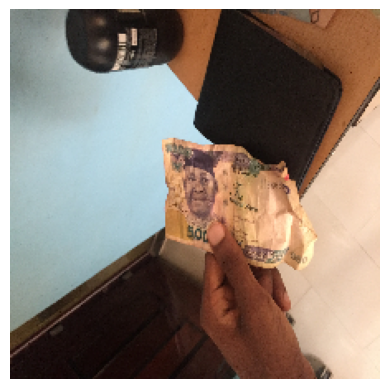

Image 37
Prediction: 1000 naira(unsure)  |  Actual: 1000 naira


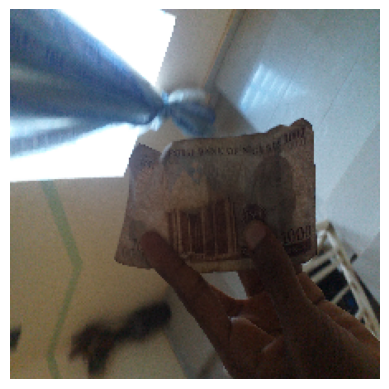

Image 38
Prediction: 50 naira  |  Actual: 50 naira


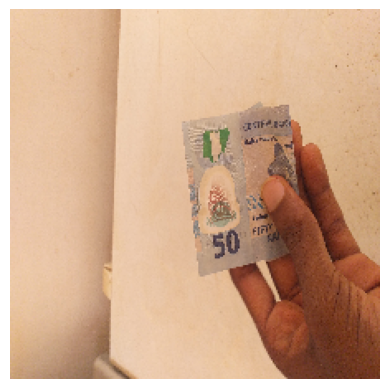

Image 39
Prediction: 1000 naira  |  Actual: 1000 naira


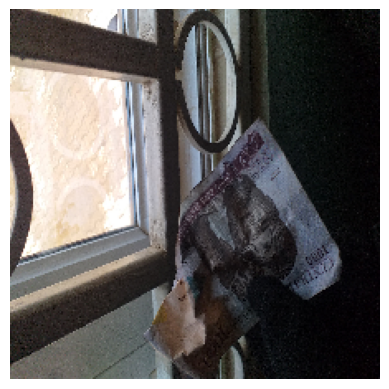

Image 40
Prediction: 200 naira  |  Actual: 200 naira


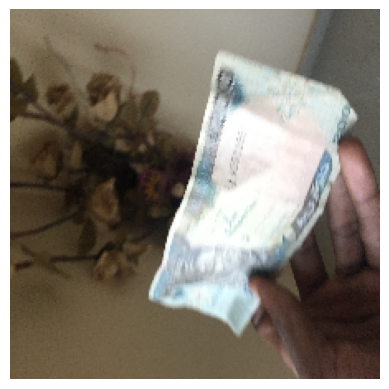

Image 41
Prediction: 500 naira  |  Actual: 500 naira


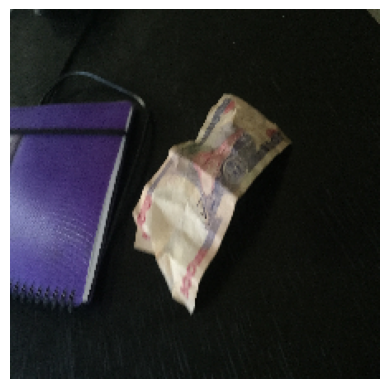

Image 42
Prediction: 50 naira  |  Actual: 50 naira


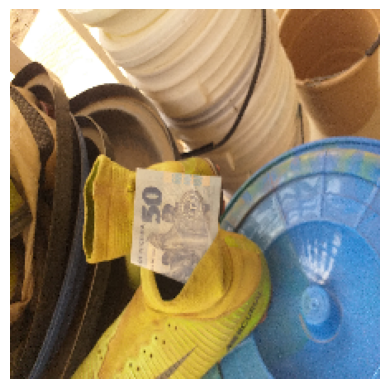

Image 43
Prediction: 50 naira  |  Actual: 50 naira


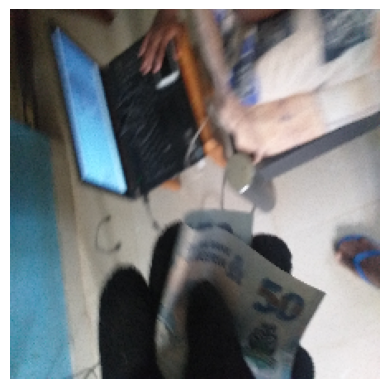

Image 44
Prediction: 20 naira  |  Actual: 20 naira


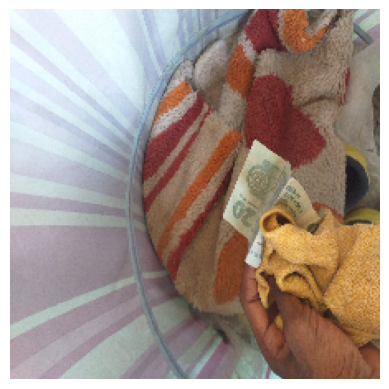

Image 45
Prediction: 500 naira(unsure)  |  Actual: 500 naira


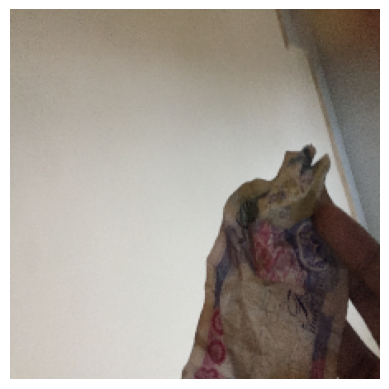

Image 46
Prediction: 20 naira  |  Actual: 20 naira


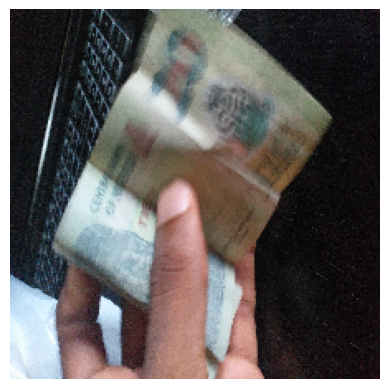

Image 47
Prediction: 20 naira  |  Actual: 20 naira


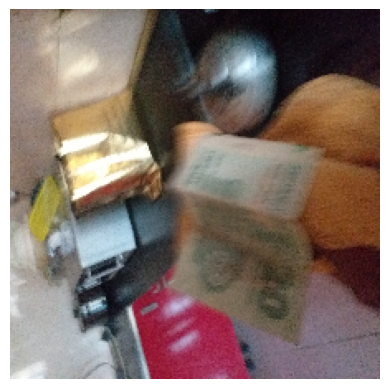

Image 48
Prediction: 1000 naira  |  Actual: 1000 naira


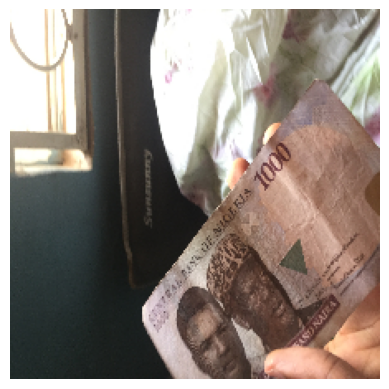

Image 49
Prediction: 200 naira  |  Actual: 200 naira


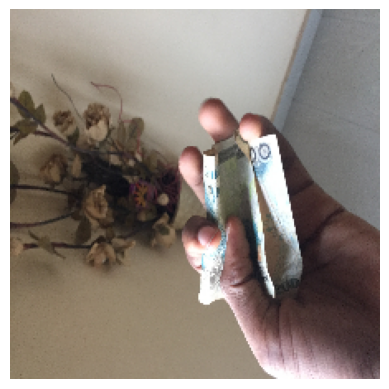

Image 50
Prediction: 1000 naira  |  Actual: 1000 naira


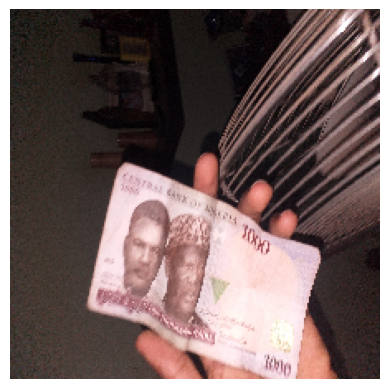

Image 51
Prediction: 500 naira(unsure)  |  Actual: 500 naira


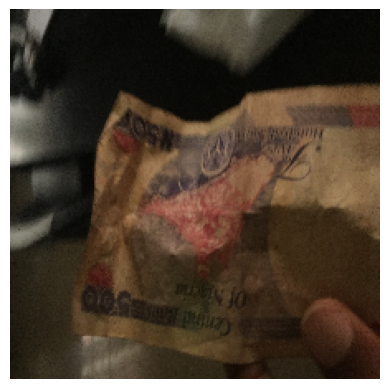

Image 52
Prediction: 50 naira  |  Actual: 50 naira


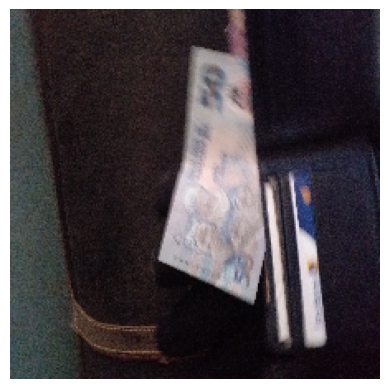

Image 53
Prediction: 1000 naira  |  Actual: 1000 naira


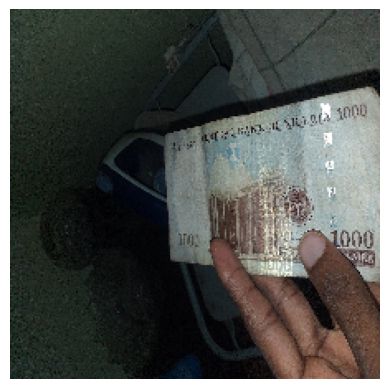

Image 54
Prediction: 500 naira  |  Actual: 500 naira


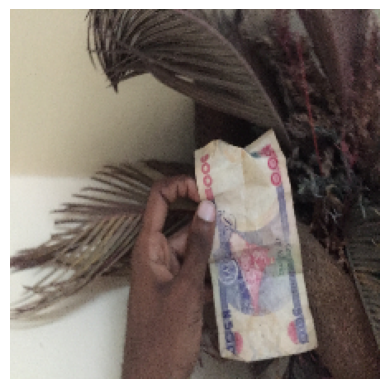

Image 55
Prediction: 50 naira(unsure)  |  Actual: 50 naira


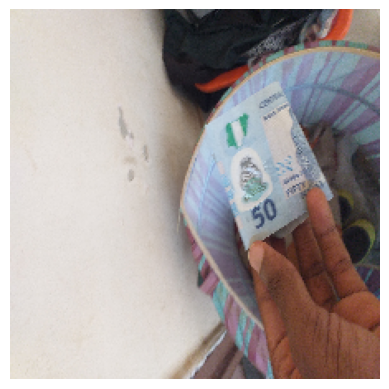

Image 56
Prediction: 500 naira  |  Actual: 500 naira


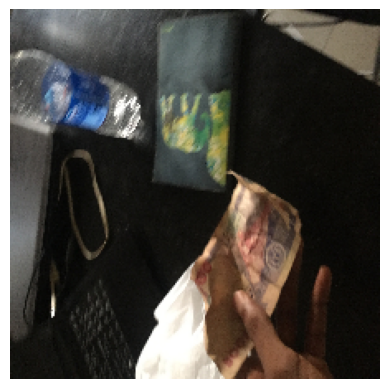

Image 57
Prediction: 200 naira(unsure)  |  Actual: 200 naira


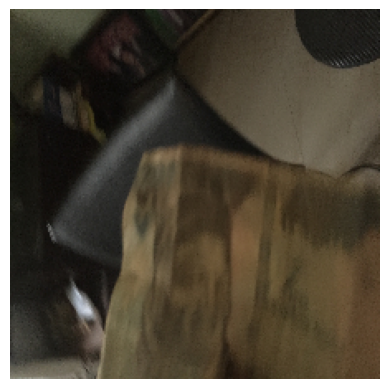

In [7]:
acc = 0
for i in range(test_images.shape[0]):
    print(f'Image {i+1}')
    index = [index for index, x in enumerate(predictions[i]) if x > 0.5]
    try:
        index = index[0]
        confidence = ''
    except IndexError:
        index = [predictions[i].index(max(predictions[i]))][0]
        confidence = '(unsure)'
    
    if pre_dict[f'model_{index}'] == true_labels[i]:
        acc += 1
    pred = pre_dict[f'model_{index}']
    print(f'Prediction: {pred}{confidence}  |  Actual: {true_labels[i]}')
    plt.imshow(test_images[i])
    plt.axis('off')
    plt.show()

In [8]:
print("Accuracy: {:.2f}%".format(acc/len(predictions)*100))

Accuracy: 94.74%


In [9]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
img = load_img('data/naira.jpg', target_size=(224, 224))
img2 = load_img('data/naira.jpg')
# convert the image to a NumPy array and rescale to values between 0 and 1
img = img_to_array(img) / 255.0
predict_img = tf.expand_dims(img, axis=0)
new_pred = model.predict(predict_img, verbose=0)

Prediction: 50 naira(84%) and 10 naira(49%)


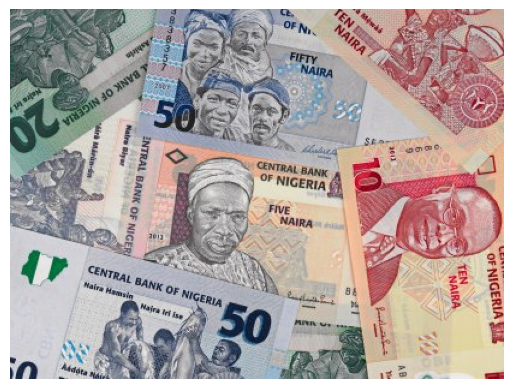

In [10]:
special_pred = new_pred.copy()
index_1 = int([special_pred.index(max(special_pred))][0])
conf_1 = int(max(special_pred) * 100)
special_pred[index_1] = 0
conf_2 = int(max(special_pred) * 100)
index_2 = int([special_pred.index(max(special_pred))][0])

print('Prediction: {}({}%) and {}({}%)'.format(pre_dict[f'model_{index_1}'], conf_1, 
                                               pre_dict[f'model_{index_2}'], conf_2))

plt.imshow(img2)
plt.axis('off')
plt.show()
# for i in range(len(new_pred)):
#     print("{}: {:.2f}%".format(pre_dict[f"model_{i}"], new_pred[i][0][0] * 100))